<a href="https://colab.research.google.com/github/sudi007/ME-592HW1/blob/main/Home_Work__1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip list
#!pip install chart-studio
!pip install opencv-python

In [455]:
!pip install plotly-express

In [456]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import cv2
import plotly_express as px
import seaborn as sns
from plotly.subplots import make_subplots
import plotly.graph_objects as go


**1:1:Sudoku**

---

1. Load sudoku-original.png image in grayscale mode

(423, 419)


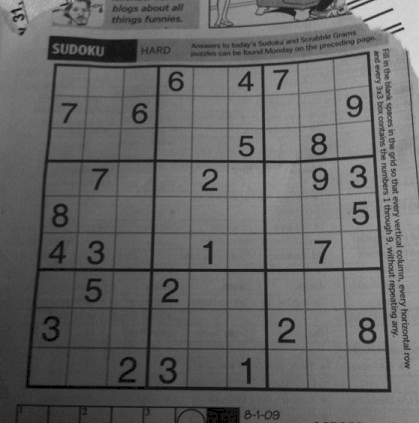

In [457]:
import cv2
from google.colab.patches import cv2_imshow
# last argument 1 is for rgb, 0 is for grayscale
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/ME 592X/sudoku-original.png',0)
print(img.shape)
cv2_imshow(img)

2. Plot the histogram of intensities.

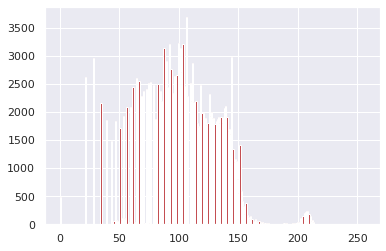

In [458]:

_ = plt.hist(img.flatten(),256,[0,256], color = 'r')

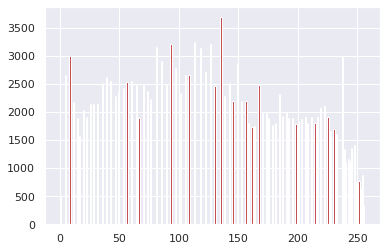

In [459]:
# histogram equalization can be used to improve constrast of img
equ = cv2.equalizeHist(img)
_ = plt.hist(equ.flatten(),256,[0,256], color = 'r')

3. Choose 4 appropriate points and perform a Perspective Transformation to obtain the sudoku as a proper square.

In [460]:
img = cv2.imread('/content/drive/MyDrive/Colab Notebooks/ME 592X/sudoku-original.png',0)
print(type(img))
print(img.shape)
print(img)

<class 'numpy.ndarray'>
(423, 419)
[[168 164 170 ... 206 206 206]
 [168 164 170 ... 205 205 205]
 [165 163 164 ... 206 206 206]
 ...
 [ 43  43  43 ... 130 133 136]
 [ 46  45  43 ... 132 134 134]
 [ 48  47  43 ... 132 132 131]]


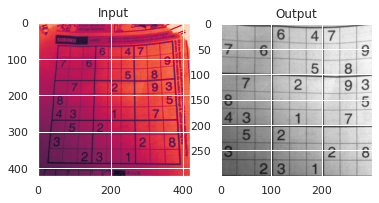

In [461]:
pts1 = np.float32([[56,65],[368,52],[28,387],[389,390]])
pts2 = np.float32([[0,0],[300,0],[0,300],[300,300]])
Original = cv2.getPerspectiveTransform(pts1,pts2)
Squared_ = cv2.warpPerspective(img,Original,(300,300))
plt.subplot(121),plt.imshow(img),plt.title('Input')
plt.subplot(122),plt.imshow(Squared_,cmap='gray'),plt.title('Output')
plt.show()

**2.2:Time series**

---


In [462]:
import pandas as pd
df=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ME 592X/energydata_complete.csv')
df.head()


,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,Energy Consumption
0,1/11/2016 17:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,45.566667,17.166667,55.20,7.026667,84.256667,17.200000,41.626667,18.2,48.900000,17.033333,45.53,6.60,733.5,92.0,7.000000,63.000000,5.3,13.275433
1,1/11/2016 17:10,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,45.992500,17.166667,55.20,6.833333,84.063333,17.200000,41.560000,18.2,48.863333,17.066667,45.56,6.48,733.6,92.0,6.666667,59.166667,5.2,18.606195
2,1/11/2016 17:20,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,45.890000,17.166667,55.09,6.560000,83.156667,17.200000,41.433333,18.2,48.730000,17.000000,45.50,6.37,733.7,92.0,6.333333,55.333333,5.1,28.642668
3,1/11/2016 17:30,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,45.723333,17.166667,55.09,6.433333,83.423333,17.133333,41.290000,18.1,48.590000,17.000000,45.40,6.25,733.8,92.0,6.000000,51.500000,5.0,45.410390
4,1/11/2016 17:40,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,45.530000,17.200000,55.09,6.366667,84.893333,17.200000,41.230000,18.1,48.590000,17.000000,45.40,6.13,733.9,92.0,5.666667,47.666667,4.9,10.084097


In [463]:
df['date'] = pd.to_datetime(df['date'],infer_datetime_format=True)

In [464]:
fig = px.line(df, x='date', y=df.columns[:], title='All Features over time')
fig.show()

In [465]:
fig = px.line(df,x='date',y='Appliances',title='Appliance Energy Consumption For whole year ')
fig.show()

In [466]:
df_week = df[0:1050].copy()

1. Plot the appliances energy consumption for whole period and a closer look at any one week of consumption.

In [467]:
Appliances_Energy_Consumption_week = px.line(df_week, x='date', y='Appliances', title='Appliances Energy Consumption For one week')
Appliances_Energy_Consumption_week.show()

In [468]:
df_hourly=df.copy()

# weekday column for plotting 
weekdays = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
weekdaysnum = [0,1,2,3,4,5,6] # The day of the week with Monday=0 to Sunday=6 with pd.dayofweek



In [469]:
df_hourly['weekday'] = [i.dayofweek for i in df_hourly['date']] # The day of the week with Monday=0 to Sunday=6.

In [470]:
for a,b in zip(weekdays, weekdaysnum):
    df_hourly['weekday'] = df_hourly['weekday'].replace(b, a)

In [471]:
df_hourly['week'] = df_hourly['date'].dt.isocalendar().week



In [472]:
df_hourly['hour'] = df_hourly['date'].dt.hour


In [473]:
heatdf = pd.DataFrame(df_hourly.groupby(['week', 'weekday','hour'])['Appliances'].sum()).reset_index()

In [474]:
heatdf["weekday"] = pd.Categorical(heatdf.weekday, categories=weekdays, ordered=True)

In [475]:

heatdf.pivot_table(index="weekday", columns="hour", values="Appliances", aggfunc='first')


hour,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23
weekday,,,,,,,,,,,,,,,,,,,,,,,,
Monday,270,260,260,250,270,200,330,330,210,270,190,270,240,240,250,200,280,330,1060,1040,750,620,1600,340
Tuesday,850,1010,270,210,270,260,240,340,520,260,1380,330,1120,910,820,220,240,1310,350,330,310,250,280,260
Wednesday,190,290,270,190,270,250,400,380,1250,1320,400,360,250,210,270,250,480,580,670,1280,1490,1880,790,250
Thursday,280,220,260,270,210,270,240,1360,960,1010,3230,1430,1700,420,780,310,1850,2430,1300,1390,660,700,290,230
Friday,320,310,280,260,300,300,270,310,1410,1240,750,750,1260,1180,380,340,340,590,1670,1320,1400,1380,1310,380
Saturday,240,320,280,250,300,240,310,1480,840,370,430,320,450,520,430,1250,450,1590,2840,2350,710,720,1020,330
Sunday,280,310,260,300,310,260,270,2090,1630,1750,540,1910,710,1020,830,490,490,2730,1610,610,660,780,330,380


2. Plot heatmap of hourly consumption of appliances for a week. An example heatmap looks like

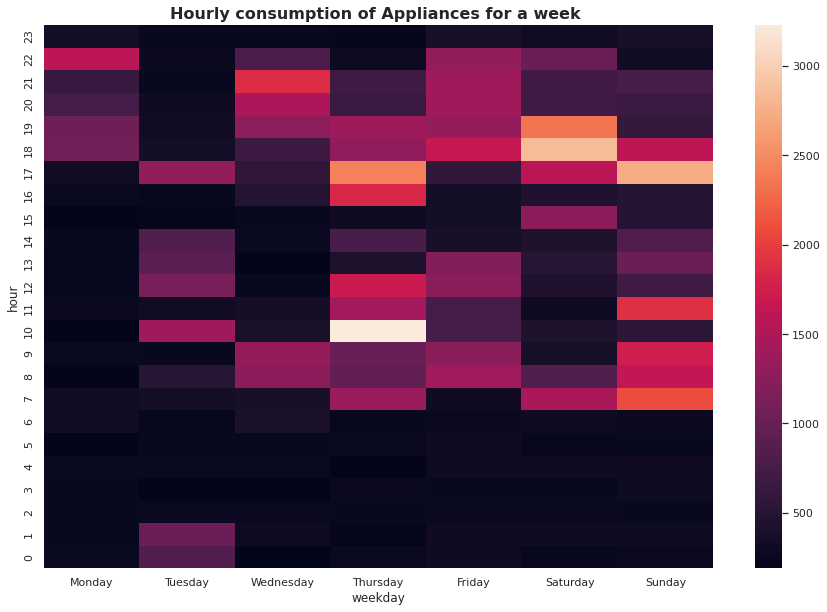

In [476]:
sns.set()
Hourly_Plot=heatdf.pivot_table(index="hour", columns="weekday", values="Appliances", aggfunc='first')
plt.figure(figsize = (15,10))
ax = sns.heatmap(Hourly_Plot)
ax.invert_yaxis()
plt.title("Hourly consumption of Appliances for a week ",fontname="Times New Roman", size=16,fontweight="bold")
plt.show()

3. Plot the histogram of energy consumption of appliances.

Text(0.5, 1.0, 'Histogram of Energy Consumption of Appliances')

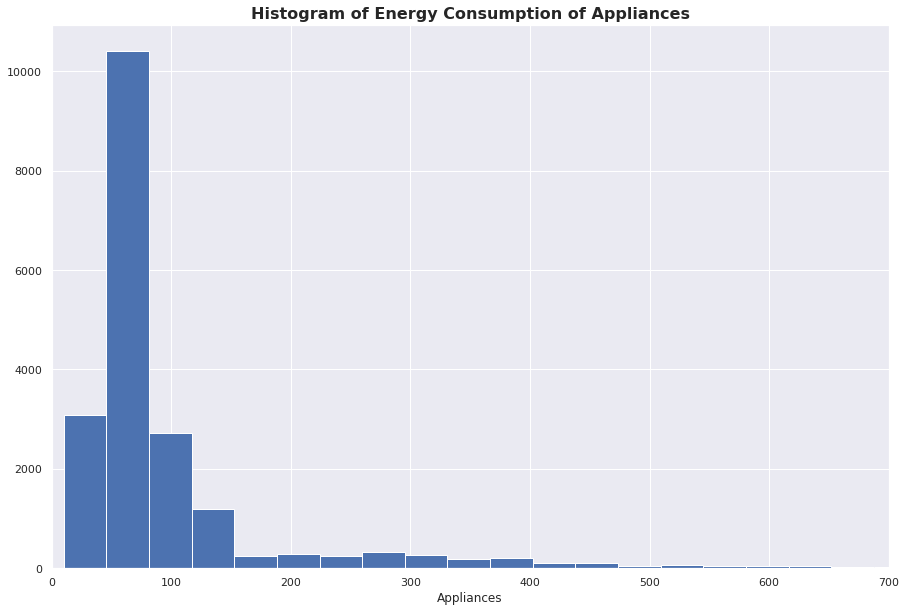

In [477]:
plt.figure(figsize = (15,10))
df['Appliances'].hist(bins=30)
plt.xlabel('Appliances')
plt.xlim([0,700])
plt.title("Histogram of Energy Consumption of Appliances",fontname="Times New Roman", size=16,fontweight="bold")

In [478]:
df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'Energy Consumption'],
      dtype='object')

In [479]:
df['Dates'] = pd.to_datetime(df['date']).dt.date
df['Time'] = pd.to_datetime(df['date']).dt.time
df['Hours']=pd.to_datetime(df['date']).dt.hour

In [480]:
from datetime import datetime

def how_many_seconds_until_midnight(hours):
    """Get the number of seconds until midnight."""
    return ((24 - hours ) * 60 * 60)

4. Construct a feature variable NSM (no. of seconds from midnight) and plot energy consumption vs. NSM.

In [481]:
df['NSM']=df['Hours'].apply(how_many_seconds_until_midnight)

In [482]:
Energy_NSM = px.histogram(df, x='Energy Consumption', y='NSM', title='Energy Consumption Before Midnight')
Energy_NSM.show()


5.Plot appliances energy consumption vs. Press mm Hg.

In [483]:
Energy_Press_mm_Hg=px.histogram(df, x='Energy Consumption', y='Press_mm_hg', title='Energy Consumption of Press_mm_Hg')
Energy_Press_mm_Hg.show()


In [484]:
df.columns

Index(['date', 'Appliances', 'lights', 'T1', 'RH_1', 'T2', 'RH_2', 'T3',
       'RH_3', 'T4', 'RH_4', 'T5', 'RH_5', 'T6', 'RH_6', 'T7', 'RH_7', 'T8',
       'RH_8', 'T9', 'RH_9', 'T_out', 'Press_mm_hg', 'RH_out', 'Windspeed',
       'Visibility', 'Tdewpoint', 'Energy Consumption', 'Dates', 'Time',
       'Hours', 'NSM'],
      dtype='object')

In [485]:
df.drop(['Dates','Dates','Time','Hours'],axis=1)

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,Energy Consumption,NSM
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,17.166667,55.200000,7.026667,84.256667,17.200000,41.626667,18.2000,48.900000,17.033333,45.5300,6.60,733.5,92.000000,7.000000,63.000000,5.3,13.275433,25200
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,17.166667,55.200000,6.833333,84.063333,17.200000,41.560000,18.2000,48.863333,17.066667,45.5600,6.48,733.6,92.000000,6.666667,59.166667,5.2,18.606195,25200
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,17.166667,55.090000,6.560000,83.156667,17.200000,41.433333,18.2000,48.730000,17.000000,45.5000,6.37,733.7,92.000000,6.333333,55.333333,5.1,28.642668,25200
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,17.166667,55.090000,6.433333,83.423333,17.133333,41.290000,18.1000,48.590000,17.000000,45.4000,6.25,733.8,92.000000,6.000000,51.500000,5.0,45.410390,25200
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,17.200000,55.090000,6.366667,84.893333,17.200000,41.230000,18.1000,48.590000,17.000000,45.4000,6.13,733.9,92.000000,5.666667,47.666667,4.9,10.084097,25200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,45.590000,23.200000,52.400000,24.796667,1.000000,24.500000,44.500000,24.7000,50.074000,23.200000,46.7900,22.70,755.2,55.666667,3.333333,23.666667,13.3,43.096812,25200
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,45.590000,23.230000,52.326667,24.196667,1.000000,24.557143,44.414286,24.7000,49.790000,23.200000,46.7900,22.60,755.2,56.000000,3.500000,24.500000,13.3,49.282940,25200
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,45.730000,23.230000,52.266667,23.626667,1.000000,24.540000,44.400000,24.7000,49.660000,23.200000,46.7900,22.50,755.2,56.333333,3.666667,25.333333,13.3,29.199117,25200
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,45.790000,23.200000,52.200000,22.433333,1.000000,24.500000,44.295714,24.6625,49.518750,23.200000,46.8175,22.30,755.2,56.666667,3.833333,26.166667,13.2,6.322784,25200


In [486]:
df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,Energy Consumption,Hours,NSM
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,19.592106,50.949283,7.910939,54.609083,20.267106,35.388200,22.029107,42.936165,19.485828,41.552401,7.412580,755.522602,79.750418,4.039752,38.330834,3.760995,24.988033,11.502002,44992.794527
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,1.844623,9.022034,6.090347,31.149806,2.109993,5.114208,1.956162,5.224361,2.014712,4.151497,5.318464,7.399441,14.901088,2.451221,11.794719,4.195248,14.496634,6.921953,24919.030504
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,15.330000,29.815000,-6.065000,1.000000,15.390000,23.200000,16.306667,29.600000,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.000000,3600.000000
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,18.277500,45.400000,3.626667,30.025000,18.700000,31.500000,20.790000,39.066667,18.000000,38.500000,3.670000,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,6.000000,25200.000000
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,19.390000,49.090000,7.300000,55.290000,20.033333,34.863333,22.100000,42.375000,19.390000,40.900000,6.920000,756.100000,83.666667,3.666667,40.000000,3.430000,24.897653,12.000000,43200.000000
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,20.619643,53.663333,11.256000,83.226667,21.600000,39.000000,23.390000,46.536000,20.600000,44.338095,10.400000,760.933333,91.666667,5.500000,40.000000,6.570000,37.583769,17.000000,64800.000000
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,25.795000,96.321667,28.290000,99.900000,26.000000,51.400000,27.230000,58.780000,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,23.000000,86400.000000


In [487]:
df.dropna()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,T5,RH_5,T6,RH_6,T7,RH_7,T8,RH_8,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,Energy Consumption,Dates,Time,Hours,NSM
0,2016-01-11 17:00:00,60,30,19.890000,47.596667,19.200000,44.790000,19.790000,44.730000,19.000000,45.566667,17.166667,55.200000,7.026667,84.256667,17.200000,41.626667,18.2000,48.900000,17.033333,45.5300,6.60,733.5,92.000000,7.000000,63.000000,5.3,13.275433,2016-01-11,17:00:00,17,25200
1,2016-01-11 17:10:00,60,30,19.890000,46.693333,19.200000,44.722500,19.790000,44.790000,19.000000,45.992500,17.166667,55.200000,6.833333,84.063333,17.200000,41.560000,18.2000,48.863333,17.066667,45.5600,6.48,733.6,92.000000,6.666667,59.166667,5.2,18.606195,2016-01-11,17:10:00,17,25200
2,2016-01-11 17:20:00,50,30,19.890000,46.300000,19.200000,44.626667,19.790000,44.933333,18.926667,45.890000,17.166667,55.090000,6.560000,83.156667,17.200000,41.433333,18.2000,48.730000,17.000000,45.5000,6.37,733.7,92.000000,6.333333,55.333333,5.1,28.642668,2016-01-11,17:20:00,17,25200
3,2016-01-11 17:30:00,50,40,19.890000,46.066667,19.200000,44.590000,19.790000,45.000000,18.890000,45.723333,17.166667,55.090000,6.433333,83.423333,17.133333,41.290000,18.1000,48.590000,17.000000,45.4000,6.25,733.8,92.000000,6.000000,51.500000,5.0,45.410390,2016-01-11,17:30:00,17,25200
4,2016-01-11 17:40:00,60,40,19.890000,46.333333,19.200000,44.530000,19.790000,45.000000,18.890000,45.530000,17.200000,55.090000,6.366667,84.893333,17.200000,41.230000,18.1000,48.590000,17.000000,45.4000,6.13,733.9,92.000000,5.666667,47.666667,4.9,10.084097,2016-01-11,17:40:00,17,25200
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19730,2016-05-27 17:20:00,100,0,25.566667,46.560000,25.890000,42.025714,27.200000,41.163333,24.700000,45.590000,23.200000,52.400000,24.796667,1.000000,24.500000,44.500000,24.7000,50.074000,23.200000,46.7900,22.70,755.2,55.666667,3.333333,23.666667,13.3,43.096812,2016-05-27,17:20:00,17,25200
19731,2016-05-27 17:30:00,90,0,25.500000,46.500000,25.754000,42.080000,27.133333,41.223333,24.700000,45.590000,23.230000,52.326667,24.196667,1.000000,24.557143,44.414286,24.7000,49.790000,23.200000,46.7900,22.60,755.2,56.000000,3.500000,24.500000,13.3,49.282940,2016-05-27,17:30:00,17,25200
19732,2016-05-27 17:40:00,270,10,25.500000,46.596667,25.628571,42.768571,27.050000,41.690000,24.700000,45.730000,23.230000,52.266667,23.626667,1.000000,24.540000,44.400000,24.7000,49.660000,23.200000,46.7900,22.50,755.2,56.333333,3.666667,25.333333,13.3,29.199117,2016-05-27,17:40:00,17,25200
19733,2016-05-27 17:50:00,420,10,25.500000,46.990000,25.414000,43.036000,26.890000,41.290000,24.700000,45.790000,23.200000,52.200000,22.433333,1.000000,24.500000,44.295714,24.6625,49.518750,23.200000,46.8175,22.30,755.2,56.666667,3.833333,26.166667,13.2,6.322784,2016-05-27,17:50:00,17,25200


In [488]:
temp_cols = ["T1","T2","T3","T4","T5","T6","T7","T8","T9"]

#humidity sensor columns
rho_cols = ["RH_1","RH_2","RH_3","RH_4","RH_5","RH_6","RH_7","RH_8","RH_9"]

#weather data
weather_cols = ["T_out", "Tdewpoint","RH_out","Press_mm_hg",
                "Windspeed","Visibility"] 
#Time
Before_Midnight=['NSM']

target = ["Appliances"]



In [489]:
seed=79

from sklearn.model_selection import train_test_split
train, test = train_test_split(df,test_size=0.30,random_state=seed)



In [490]:
input_vars = train[temp_cols+rho_cols+weather_cols+Before_Midnight]
output_var = train[target]

In [491]:
input_vars.describe()

,T1,T2,T3,T4,T5,T6,T7,T8,T9,RH_1,RH_2,RH_3,RH_4,RH_5,RH_6,RH_7,RH_8,RH_9,T_out,Tdewpoint,RH_out,Press_mm_hg,Windspeed,Visibility,NSM
count,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000,13814.000000
mean,21.692080,20.352197,22.279408,20.864875,19.606930,7.948528,20.274106,22.025529,19.493897,40.271386,40.426784,39.251662,39.052409,51.010008,54.568312,35.426281,42.960662,41.560158,7.442136,3.796685,79.802506,755.482222,4.032460,38.295584,44879.079195
std,1.618074,2.204246,2.013369,2.051509,1.849482,6.120080,2.122290,1.965231,2.026358,3.978684,4.060381,3.247837,4.344435,9.102132,31.207081,5.105987,5.217155,4.168218,5.345992,4.200716,14.920905,7.379903,2.448128,11.768990,24906.520859
min,16.790000,16.100000,17.200000,15.100000,15.340000,-6.065000,15.390000,16.306667,14.890000,27.023333,20.596667,28.766667,27.660000,29.815000,1.000000,23.260000,29.600000,29.166667,-5.000000,-6.600000,24.000000,729.333333,0.000000,1.000000,3600.000000
25%,20.760000,18.790000,20.790000,19.533333,18.290000,3.633333,18.700000,20.790000,18.000000,37.363333,37.900000,36.900000,35.552071,45.424167,29.840833,31.526429,39.126667,38.500000,3.700000,0.950000,70.333333,750.900000,2.000000,29.000000,21600.000000
50%,21.600000,20.000000,22.100000,20.670833,19.390000,7.352857,20.076389,22.108497,19.390000,39.667917,40.518250,38.560000,38.456389,49.123135,55.230000,34.900000,42.403571,40.930000,6.950000,3.500000,83.833333,756.050000,3.666667,40.000000,43200.000000
75%,22.645833,21.525000,23.356667,22.100000,20.666667,11.299167,21.611891,23.390000,20.600000,43.090000,43.266667,41.760000,42.200000,53.766667,83.262500,39.000000,46.509868,44.322232,10.400000,6.647500,91.666667,760.800000,5.500000,40.000000,64800.000000
max,26.260000,29.856667,29.236000,26.200000,25.795000,28.290000,26.000000,27.230000,24.500000,63.360000,54.766667,50.163333,51.090000,96.321667,99.900000,51.327778,58.780000,53.326667,26.000000,15.300000,100.000000,772.300000,14.000000,66.000000,86400.000000


In [492]:
output_var.describe()

,Appliances
count,13814.000000
mean,97.998407
std,102.607345
min,10.000000
25%,50.000000
50%,60.000000
75%,100.000000
max,1080.000000


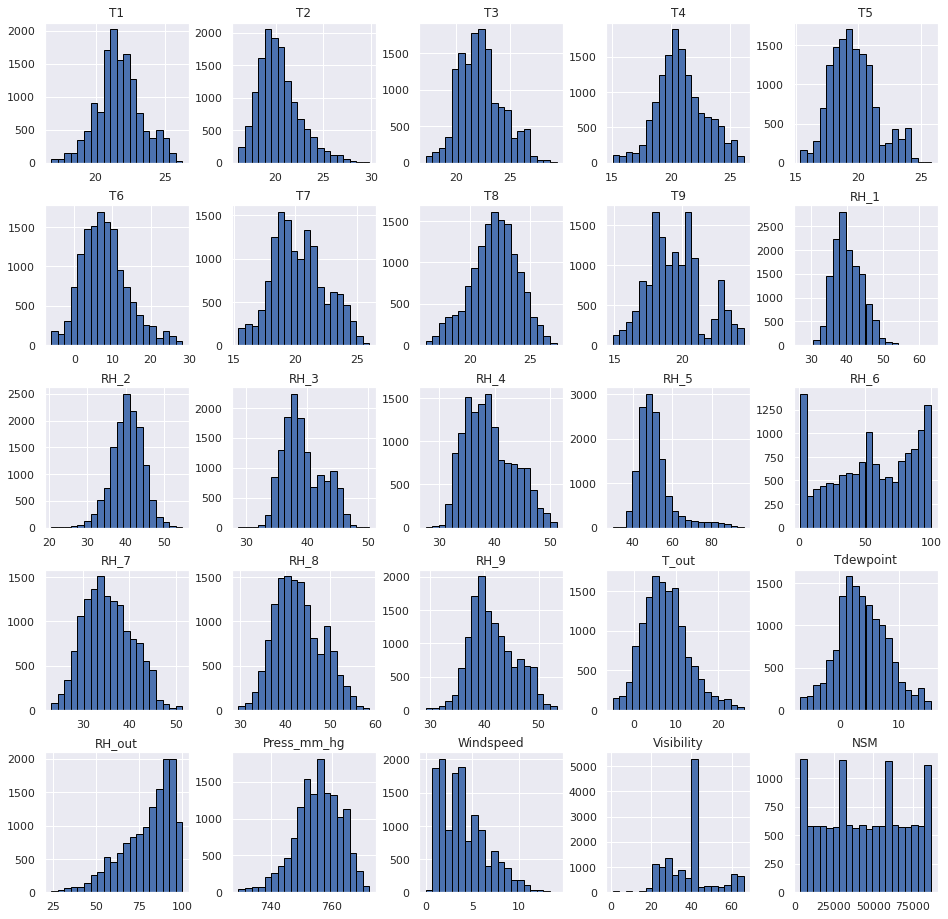

In [493]:
hists = input_vars.hist(figsize=(16, 16), bins=20,edgecolor='black')

Corelation Analysis 

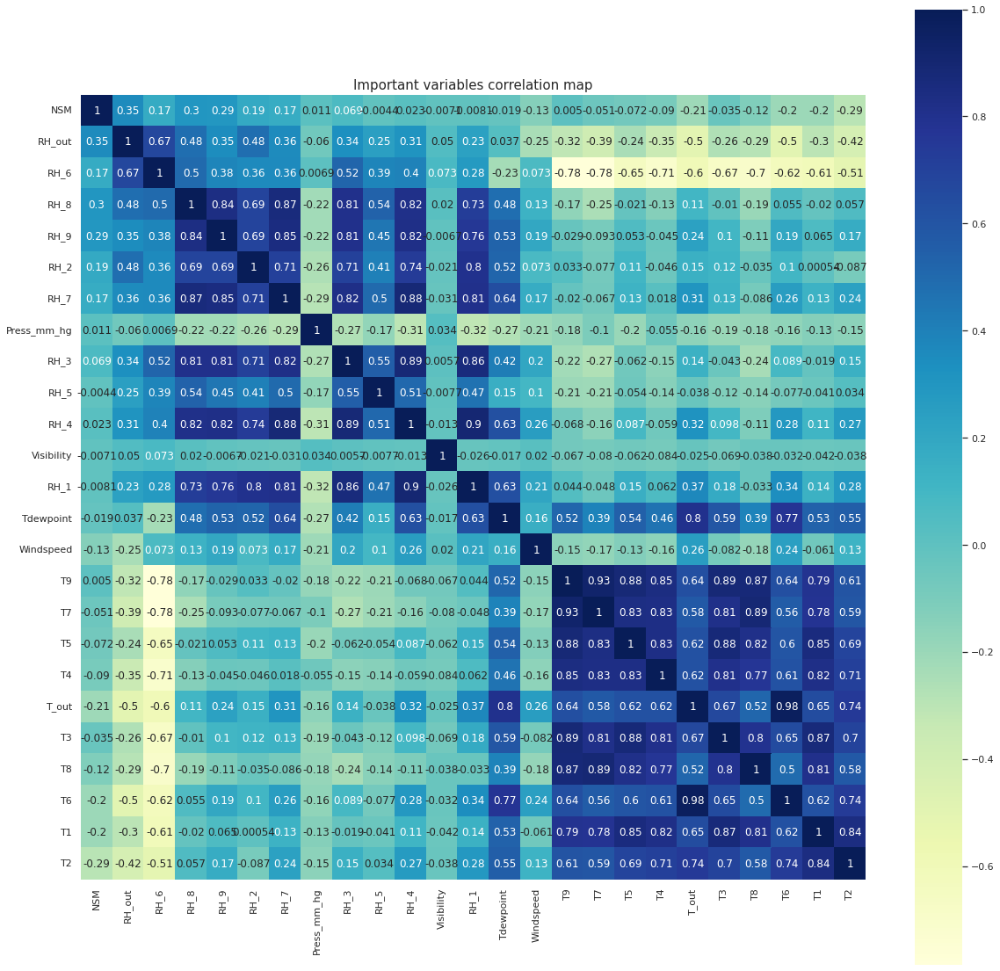

In [494]:
from scipy.stats import spearmanr
labels = []
values = []
for col in input_vars.columns:
    labels.append(col)
    values.append(spearmanr(input_vars[col].values, output_var.values)[0])
corr_df = pd.DataFrame({'col_labels':labels, 'corr_values':values})
corr_df = corr_df.sort_values(by='corr_values')
#corr_df = corr_df[(corr_df['corr_values']>=0.1) | (corr_df['corr_values']<=-0.1)]
rel_cols = corr_df.col_labels.tolist()
temp_df = train[rel_cols]
corrmat = temp_df.corr(method='spearman')
f,ax = plt.subplots(figsize=(20,20))
sns.heatmap(corrmat, vmax=1., square=True, cmap = 'YlGnBu', annot=True)
plt.title("Important variables correlation map", fontsize=15)
plt.show()



In [495]:
input_vars.columns

Index(['T1', 'T2', 'T3', 'T4', 'T5', 'T6', 'T7', 'T8', 'T9', 'RH_1', 'RH_2',
       'RH_3', 'RH_4', 'RH_5', 'RH_6', 'RH_7', 'RH_8', 'RH_9', 'T_out',
       'Tdewpoint', 'RH_out', 'Press_mm_hg', 'Windspeed', 'Visibility', 'NSM'],
      dtype='object')

In [496]:
rel_cols

['NSM',
 'RH_out',
 'RH_6',
 'RH_8',
 'RH_9',
 'RH_2',
 'RH_7',
 'Press_mm_hg',
 'RH_3',
 'RH_5',
 'RH_4',
 'Visibility',
 'RH_1',
 'Tdewpoint',
 'Windspeed',
 'T9',
 'T7',
 'T5',
 'T4',
 'T_out',
 'T3',
 'T8',
 'T6',
 'T1',
 'T2']

In [497]:
train_X = train[input_vars.columns]
train_Y = train[output_var.columns]


In [498]:
train_X = train_X.drop(["T6", "T9"], axis=1)

In [499]:
from sklearn import ensemble
model = ensemble.ExtraTreesRegressor(n_estimators=200, max_depth=20, max_features=0.5, n_jobs=-1, random_state=0)
model.fit(train_X, train_Y)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



ExtraTreesRegressor(max_depth=20, max_features=0.5, n_estimators=200, n_jobs=-1,
                    random_state=0)

In [500]:
feature_names = train_X.columns.values
importances = model.feature_importances_
indices = np.argsort(importances)[::-1]

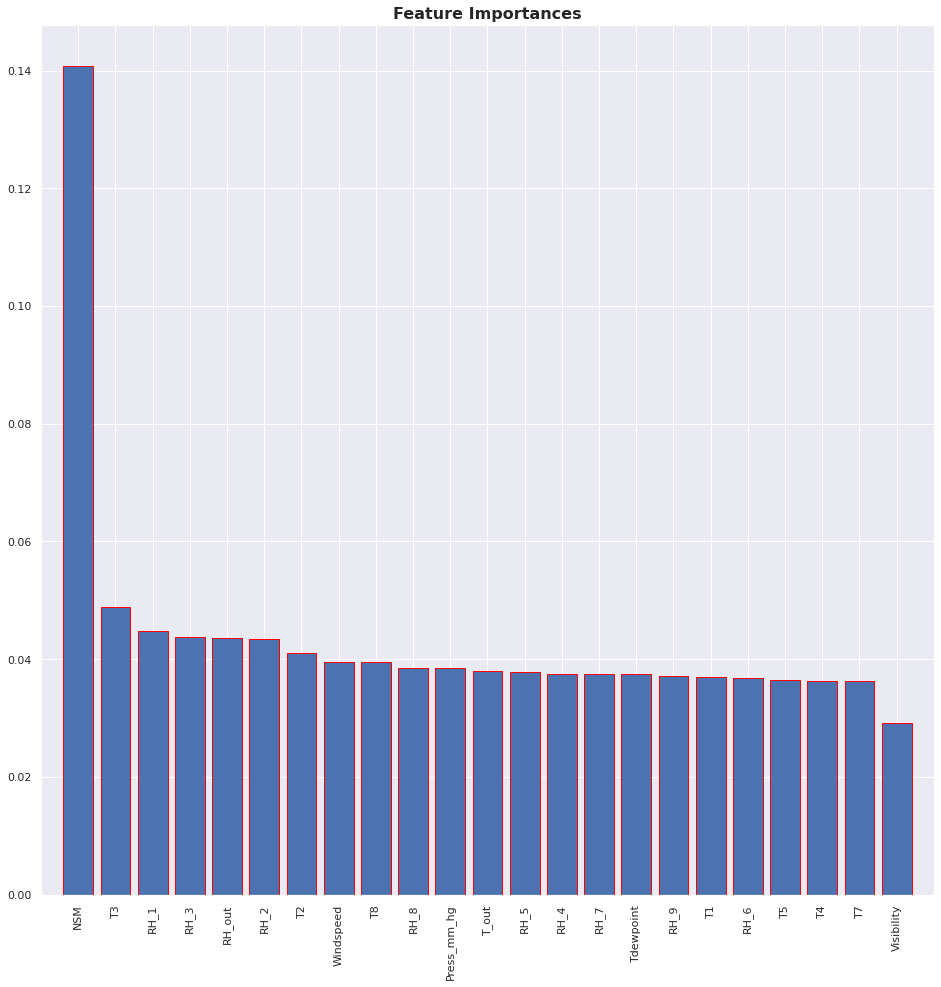

In [501]:
plt.figure(figsize=(16,16))
plt.title("Feature Importances",fontname="Times New Roman", size=16,fontweight="bold")
plt.bar(range(len(indices)), importances[indices], color='b', align="center",edgecolor='red')
plt.xticks(range(len(indices)), feature_names[indices], rotation='vertical')
plt.xlim([-1, len(indices)])
plt.show()

6. It is observed that the major contributing factors for the energy consumption
among all other features is NSM and Press mm Hg. Comment on it.


Observations
Temperature ranges for all home sensors is between 14.89℃ to 29.86℃, except for T6, for which it is -6.06℃ to 28.29℃. The reason for such low readings is that the sensor is kept outside.
Similarly, humidity ranges for all home sensors is between 20.60% to 63.36%. Except for RH_5 and RH_6, whose ranges are 29.82% to 96.32% and 1% to 99.9% respectively.
This is because RH_5 is inside the bathroom and RH_6 is outside the building, explaining the high humidity values.
An interesting observation in the Appliances column is that although the max consumption is 1080Wh, 75% of values are less than 100Wh. This shows that there are fewer cases when Appliance energy consumption is very high.

It can be observed from Histograms that:-
All humidity values except RH_6 and RH_out follow a Normal distribution. That is, all the readings from sensors inside the home are from a Normal distribution.
Similarly, all temperature readings follow a Normal distribution, except T9.
Out of the remaining columns, we can see that Visibility, Windspeed and Appliances are skewed.
This shows all the relevant columns which have the most impact on the output variable has (absolute correlation value >= 0.1). It is observed that NSM is a major contributing factor for energy consumption whereas Press mm Hg is not.beacuse there is more energy consumption when its humid rather then when the temprature are high   





Task_2.3:Nasa Data 

In [502]:
import statistics
Nasa_Data=pd.read_csv('/content/drive/MyDrive/Colab Notebooks/ME 592X/airfoil_self_noise.csv')
Nasa_Data.head()

,Frequency,Angle of attack,Chord length,velocity,"thickness,",Pressure Level
0,800,0.0,0.3048,71.3,0.002663,126.201
1,1000,0.0,0.3048,71.3,0.002663,125.201
2,1250,0.0,0.3048,71.3,0.002663,125.951
3,1600,0.0,0.3048,71.3,0.002663,127.591
4,2000,0.0,0.3048,71.3,0.002663,127.461


In [503]:
pd.DataFrame([Nasa_Data.mean(), Nasa_Data.std(), Nasa_Data.var(),Nasa_Data.median(),Nasa_Data.kurtosis(),Nasa_Data.skew(),Nasa_Data.max(),Nasa_Data.min()], index=['Mean', 'Std. dev', 'Variance','Median','Kurtosis','Skewness','Maximum','Minimum']).round(decimals=2)

,Frequency,Angle of attack,Chord length,velocity,"thickness,",Pressure Level
Mean,2886.38,6.78,0.14,50.86,0.01,124.84
Std. dev,3152.57,5.92,0.09,15.57,0.01,6.90
Variance,9938717.38,35.02,0.01,242.51,0.00,47.59
Median,1600.00,5.40,0.10,39.60,0.00,125.72
Kurtosis,5.71,-0.41,-1.04,-1.56,2.22,-0.31
Skewness,2.14,0.69,0.46,0.24,1.70,-0.42
Maximum,20000.00,22.20,0.30,71.30,0.06,140.99
Minimum,200.00,0.00,0.03,31.70,0.00,103.38


References:
1. https://github.com/LuisM78/Appliances-energy-prediction-data
2. Data driven prediction models of energy use of appliances in a low-energy house.Luis M. Candanedo, V´eronique Feldheim, Dominique Deramaix. Energy and Buildings,Volume 140, 1 April 2017, Pages 81-97, ISSN 0378-7788
3. https://archive.ics.uci.edu/ml/datasets/Airfoil+Self-Noise
4. T.F. Brooks, D.S. Pope, and A.M. Marcolini. Airfoil self-noise and prediction.Technical report, NASA RP-1218, July 1989.
5.https://github.com/vivekpandian08/Appliances-Energy-Prediction
6.https://www.kaggle.com/joegurt/appliance-energy-time-series-eda-and-regression
7.https://github.com/siyalsonarkar18/Appliance-s-Energy-Prediction/blob/master/Code_project.ipynb
